In [100]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import plotly.express as px
pd.options.display.float_format = '{:,.2f}'.format  

In [101]:
df=pd.read_csv("Loan approval prediction.csv")

In [102]:
df

,id,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,0,37,35000,RENT,0.00,EDUCATION,B,6000,11.49,0.17,N,14,0
1,1,22,56000,OWN,6.00,MEDICAL,C,4000,13.35,0.07,N,2,0
2,2,29,28800,OWN,8.00,PERSONAL,A,6000,8.90,0.21,N,10,0
3,3,30,70000,RENT,14.00,VENTURE,B,12000,11.11,0.17,N,5,0
4,4,22,60000,RENT,2.00,MEDICAL,A,6000,6.92,0.10,N,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,58640,34,120000,MORTGAGE,5.00,EDUCATION,D,25000,15.95,0.21,Y,10,0
58641,58641,28,28800,RENT,0.00,MEDICAL,C,10000,12.73,0.35,N,8,1
58642,58642,23,44000,RENT,7.00,EDUCATION,D,6800,16.00,0.15,N,2,1
58643,58643,22,30000,RENT,2.00,EDUCATION,A,5000,8.90,0.17,N,3,0


In [103]:
df.describe()

,id,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_percent_income,cb_person_cred_hist_length,loan_status
count,"58,645.00","58,645.00","58,645.00","58,645.00","58,645.00","58,645.00","58,645.00","58,645.00","58,645.00"
mean,"29,322.00",27.55,"64,046.17",4.70,"9,217.56",10.68,0.16,5.81,0.14
std,"16,929.50",6.03,"37,931.11",3.96,"5,563.81",3.03,0.09,4.03,0.35
min,0.00,20.00,"4,200.00",0.00,500.00,5.42,0.00,2.00,0.00
25%,"14,661.00",23.00,"42,000.00",2.00,"5,000.00",7.88,0.09,3.00,0.00
50%,"29,322.00",26.00,"58,000.00",4.00,"8,000.00",10.75,0.14,4.00,0.00
75%,"43,983.00",30.00,"75,600.00",7.00,"12,000.00",12.99,0.21,8.00,0.00
max,"58,644.00",123.00,"1,900,000.00",123.00,"35,000.00",23.22,0.83,30.00,1.00



# Data Cleaning

# Check Missing Values and Meta Data

In [104]:
df.isna().sum()

id                            0
person_age                    0
person_income                 0
person_home_ownership         0
person_emp_length             0
loan_intent                   0
loan_grade                    0
loan_amnt                     0
loan_int_rate                 0
loan_percent_income           0
cb_person_default_on_file     0
cb_person_cred_hist_length    0
loan_status                   0
dtype: int64

In [105]:
df = df.drop(columns=['id'])

In [106]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58645 entries, 0 to 58644
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  58645 non-null  int64  
 1   person_income               58645 non-null  int64  
 2   person_home_ownership       58645 non-null  object 
 3   person_emp_length           58645 non-null  float64
 4   loan_intent                 58645 non-null  object 
 5   loan_grade                  58645 non-null  object 
 6   loan_amnt                   58645 non-null  int64  
 7   loan_int_rate               58645 non-null  float64
 8   loan_percent_income         58645 non-null  float64
 9   cb_person_default_on_file   58645 non-null  object 
 10  cb_person_cred_hist_length  58645 non-null  int64  
 11  loan_status                 58645 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 5.4+ MB


In [107]:
df.describe(include='object')

,person_home_ownership,loan_intent,loan_grade,cb_person_default_on_file
count,58645,58645,58645,58645
unique,4,6,7,2
top,RENT,EDUCATION,A,N
freq,30594,12271,20984,49943


# Handeling Outliers

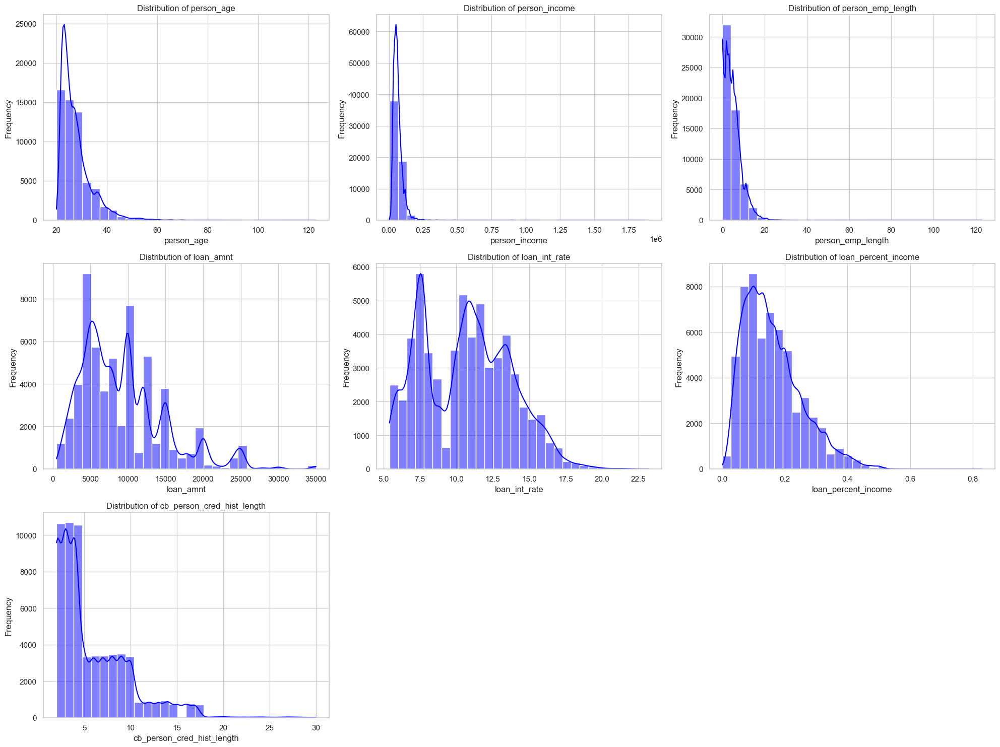

In [108]:
sns.set(style="whitegrid")

# Numerical columns to analyze
numerical_columns = [
    "person_age",
    "person_income",
    "person_emp_length",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "cb_person_cred_hist_length",
]

# Plot distributions of numerical features
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[col], kde=True, bins=30, color="blue")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [109]:
# Select only numeric columns
numeric_cols = df.select_dtypes(include=['number']).columns

# Create interactive box plots for each numeric column
for col in numeric_cols:
    fig = px.box(
        df,
        x=col,  # Horizontal box plot
        title=f'Interactive Box Plot for {col}',
        template="plotly_white",
    )
    fig.update_layout(
        xaxis_title=col,
        yaxis_title="Values",
    )
    fig.show()

In [110]:
df_age_above_45= df[df['person_age']<=45]
filtered_age_income=df_age_above_45[(df_age_above_45['person_income'] <= 150000)]
filtered_df = filtered_age_income[(filtered_age_income['person_emp_length']<= 15)]
df = filtered_df[filtered_df['loan_amnt']<=25000]

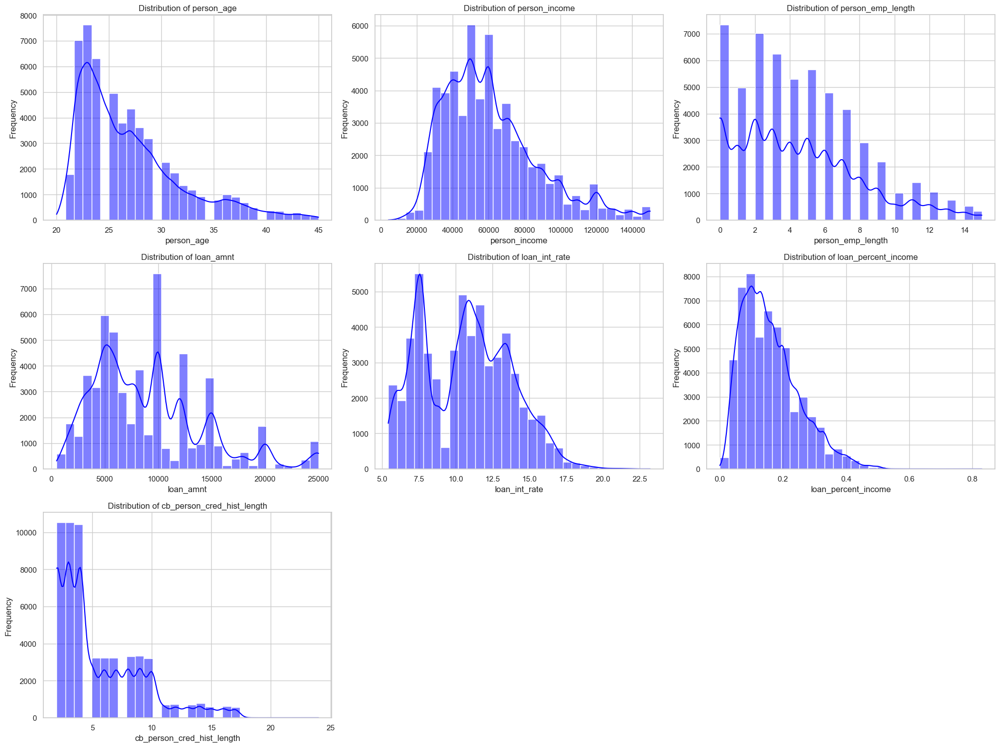

In [111]:
sns.set(style="whitegrid")

# Numerical columns to analyze
numerical_columns = [
    "person_age",
    "person_income",
    "person_emp_length",
    "loan_amnt",
    "loan_int_rate",
    "loan_percent_income",
    "cb_person_cred_hist_length",
]

# Plot distributions of numerical features
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_columns, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[col], kde=True, bins=30, color="blue")
    plt.title(f"Distribution of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# Handling Categorical Columns

In [112]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status
0,37,35000,RENT,0.00,EDUCATION,B,6000,11.49,0.17,N,14,0
1,22,56000,OWN,6.00,MEDICAL,C,4000,13.35,0.07,N,2,0
2,29,28800,OWN,8.00,PERSONAL,A,6000,8.90,0.21,N,10,0
3,30,70000,RENT,14.00,VENTURE,B,12000,11.11,0.17,N,5,0
4,22,60000,RENT,2.00,MEDICAL,A,6000,6.92,0.10,N,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,MORTGAGE,5.00,EDUCATION,D,25000,15.95,0.21,Y,10,0
58641,28,28800,RENT,0.00,MEDICAL,C,10000,12.73,0.35,N,8,1
58642,23,44000,RENT,7.00,EDUCATION,D,6800,16.00,0.15,N,2,1
58643,22,30000,RENT,2.00,EDUCATION,A,5000,8.90,0.17,N,3,0


In [113]:
df["loan_grade"].value_counts()

loan_grade
A    19883
B    19391
C    10566
D     4754
E      961
F      134
G       32
Name: count, dtype: int64

In [114]:
df["loan_intent"].value_counts()

loan_intent
EDUCATION            11883
MEDICAL              10442
VENTURE               9474
PERSONAL              9280
DEBTCONSOLIDATION     8767
HOMEIMPROVEMENT       5875
Name: count, dtype: int64

In [115]:
df["person_home_ownership"].value_counts()

person_home_ownership
RENT        29584
MORTGAGE    23092
OWN          2964
OTHER          81
Name: count, dtype: int64

# EDA

In [116]:
# Add column to make EDA more easier
df['Age Level'] = pd.cut(
    df['person_age'],
    bins=[19, 25, 35, 45],  # Define the bins
    labels=['Level 1', 'Level 2', 'Level 3'],  # Define the labels for each bin
    right=True  # Include the rightmost edge of the interval
)

C:\Users\DANTECH\AppData\Local\Temp\ipykernel_16304\1101047235.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



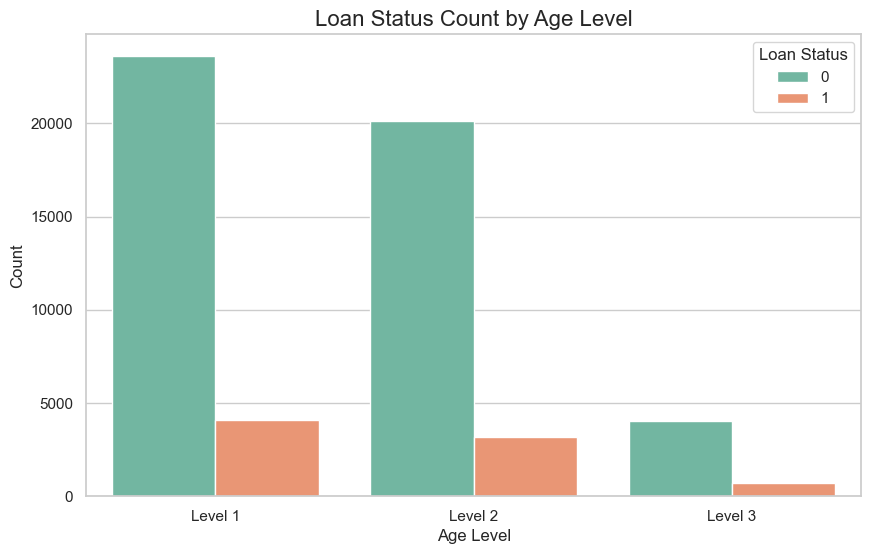

In [117]:
grouped_data = df.groupby(["Age Level", "loan_status"])["loan_status"].count().reset_index(name="count")

# Set up a bar plot to visualize the counts
plt.figure(figsize=(10, 6))
sns.barplot(data=grouped_data, x="Age Level", y="count", hue="loan_status", palette="Set2")

# Add labels and title
plt.title("Loan Status Count by Age Level", fontsize=16)
plt.xlabel("Age Level", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.legend(title="Loan Status")
plt.show()

In [118]:
df.groupby(["Age Level","loan_intent"])["loan_intent"].count().sort_values(ascending=False)

Age Level  loan_intent      
Level 1    EDUCATION            7521
           MEDICAL              4856
           VENTURE              4852
Level 2    MEDICAL              4660
Level 1    DEBTCONSOLIDATION    4375
           PERSONAL             4350
Level 2    PERSONAL             4057
           VENTURE              3820
           DEBTCONSOLIDATION    3742
           EDUCATION            3608
           HOMEIMPROVEMENT      3424
Level 1    HOMEIMPROVEMENT      1748
Level 3    MEDICAL               926
           PERSONAL              873
           VENTURE               802
           EDUCATION             754
           HOMEIMPROVEMENT       703
           DEBTCONSOLIDATION     650
Name: loan_intent, dtype: int64

In [119]:
ages_level = df.groupby(["Age Level", "loan_intent"])["loan_intent"] \
    .count() \
    .sort_index(level="Age Level") \
    .sort_values(ascending=False, kind="mergesort")

# Convert to DataFrame and reset index
ages_level = ages_level.reset_index(name="count")

# Create the Plotly bar chart
fig = px.bar(
    ages_level,
    x="Age Level",
    y="count",
    color="loan_intent",
    text="count",
    title="Loan Intent Distribution Across Age Levels",
    labels={"count": "Loan Intent Count", "loan_intent": "Loan Intent"},
    barmode="group",  # Use 'stack' for a stacked bar chart
    hover_name="loan_intent"
)

fig.show()

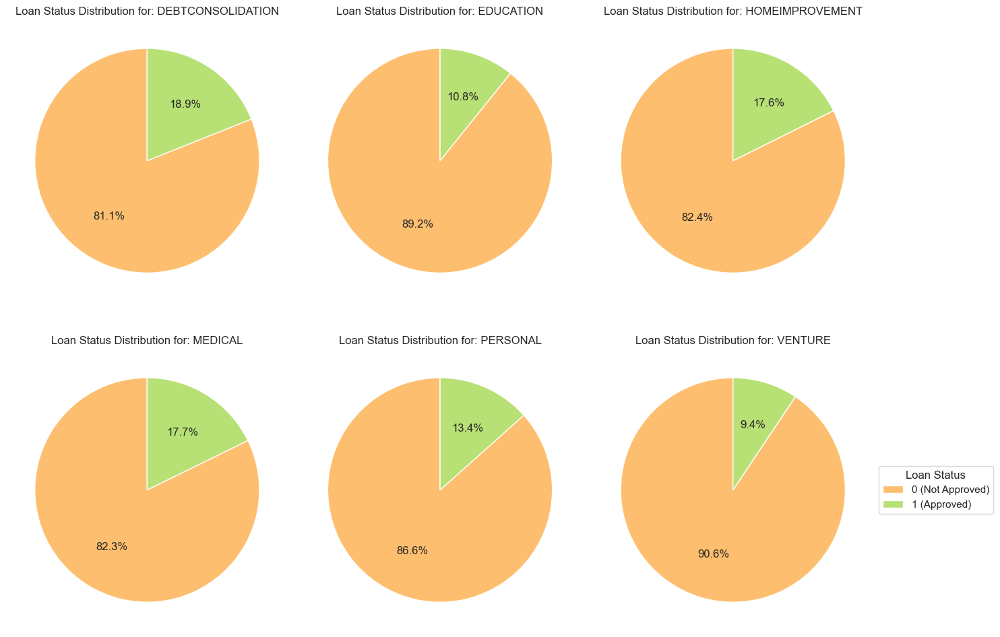

In [120]:
# Group by loan_intent and loan_status, calculate percentages
percentages = df.groupby(["loan_intent", "loan_status"])["loan_status"] \
    .count() \
    .groupby(level=0) \
    .apply(lambda x: 100 * x / x.sum())

loan_intents = percentages.index.get_level_values(0).unique()

# Define the number of rows and columns for subplots
n_cols = 3  # Number of columns in the grid
n_rows = (len(loan_intents) + n_cols - 1) // n_cols  # Number of rows required to fit all charts

# Create a figure and subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))  # Adjust figsize for multiple charts

# Flatten axes for easy iteration if the grid has more than one row
axes = axes.flatten()

# Define the color mapping for loan statuses
status_colors = sns.color_palette("RdYlGn", 2)  # Red for 1 (loan default), Green for 0 (loan approved)
status_labels = ["0 (Not Approved)","1 (Approved)"]  # Legend labels for loan statuses

# Loop through each unique loan_intent and plot the pie chart for its loan status distribution
for i, intent in enumerate(loan_intents):
    # Filter the percentages for the specific loan intent
    intent_percentage = percentages.xs(key=intent, level=0)
    
    # Plot a pie chart for the specific loan intent's loan status distribution
    wedges, texts, autotexts = axes[i].pie(intent_percentage, labels=None, autopct='%1.1f%%',
                                           colors=status_colors, startangle=90)
    axes[i].set_title(f"Loan Status Distribution for: {intent}")

# Add the legend to the last plot (right side of the last pie chart)
axes[-1].legend(wedges, status_labels, title="Loan Status", loc="center left", bbox_to_anchor=(1, 0.5))

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

# Adjust layout to make sure everything fits well
plt.tight_layout()
plt.show()

In [121]:
df

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status,Age Level
0,37,35000,RENT,0.00,EDUCATION,B,6000,11.49,0.17,N,14,0,Level 3
1,22,56000,OWN,6.00,MEDICAL,C,4000,13.35,0.07,N,2,0,Level 1
2,29,28800,OWN,8.00,PERSONAL,A,6000,8.90,0.21,N,10,0,Level 2
3,30,70000,RENT,14.00,VENTURE,B,12000,11.11,0.17,N,5,0,Level 2
4,22,60000,RENT,2.00,MEDICAL,A,6000,6.92,0.10,N,3,0,Level 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,MORTGAGE,5.00,EDUCATION,D,25000,15.95,0.21,Y,10,0,Level 2
58641,28,28800,RENT,0.00,MEDICAL,C,10000,12.73,0.35,N,8,1,Level 2
58642,23,44000,RENT,7.00,EDUCATION,D,6800,16.00,0.15,N,2,1,Level 1
58643,22,30000,RENT,2.00,EDUCATION,A,5000,8.90,0.17,N,3,0,Level 1


In [122]:
df.groupby('loan_intent')['loan_amnt'].median()

loan_intent
DEBTCONSOLIDATION   8,000.00
EDUCATION           8,000.00
HOMEIMPROVEMENT     9,500.00
MEDICAL             7,500.00
PERSONAL            8,000.00
VENTURE             8,000.00
Name: loan_amnt, dtype: float64

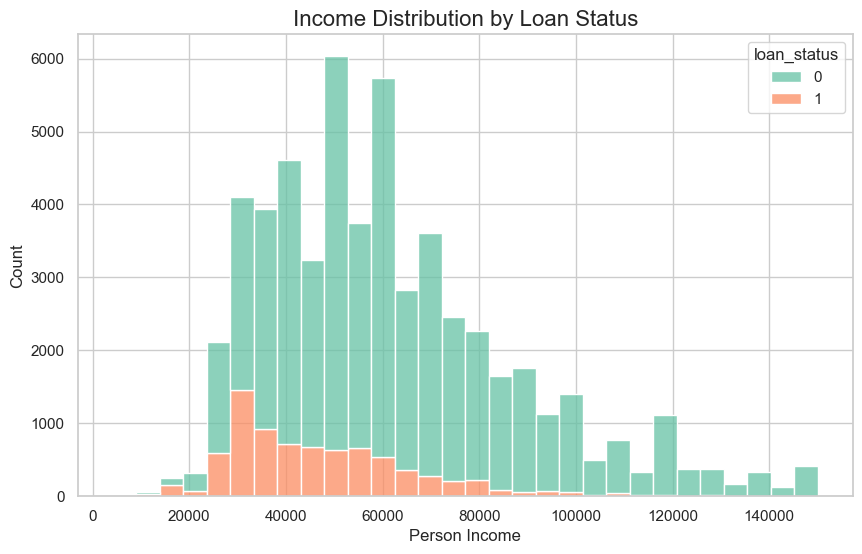

In [123]:
plt.figure(figsize=(10, 6))

# Plot histogram for person_income grouped by loan_status
sns.histplot(data=df, x="person_income", hue="loan_status", kde=False, bins=30, palette="Set2", multiple="stack")

# Add labels and title
plt.title("Income Distribution by Loan Status", fontsize=16)
plt.xlabel("Person Income", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.show()

# We can focus more on peope their income between 20000 and 60000 which more visibility to take a loan

In [124]:
df.groupby(['person_home_ownership', 'loan_status']).size().unstack()

loan_status,0,1
person_home_ownership,,
MORTGAGE,21716,1376
OTHER,67,14
OWN,2925,39
RENT,23053,6531


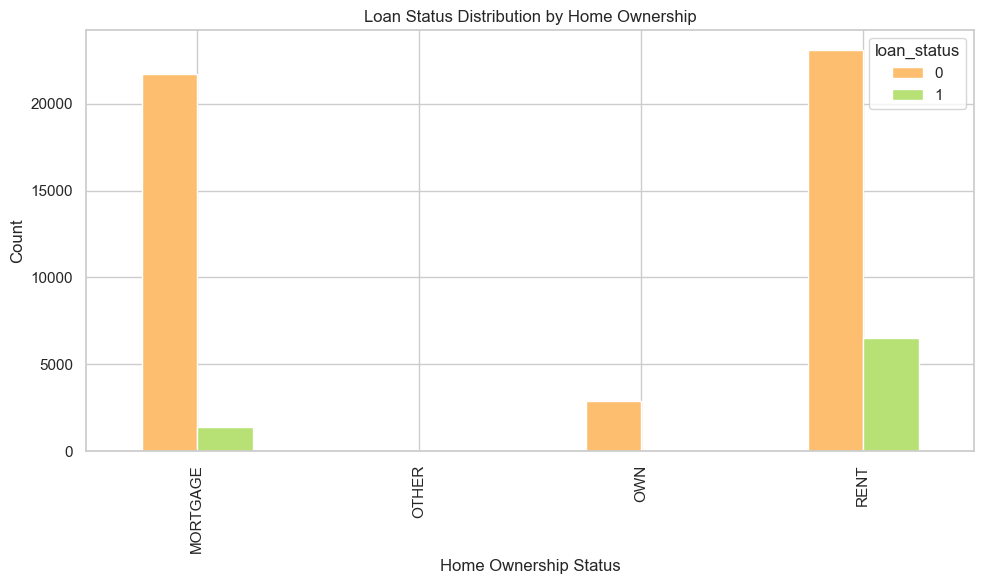

In [125]:
home_ownership_loan_status = df.groupby(['person_home_ownership', 'loan_status']).size().unstack()

# Plot the grouped bar chart
home_ownership_loan_status.plot(kind='bar', figsize=(10, 6), color=sns.color_palette("RdYlGn", 2))

# Set labels and title
plt.xlabel('Home Ownership Status')
plt.ylabel('Count')
plt.title('Loan Status Distribution by Home Ownership')

# Display the chart
plt.tight_layout()
plt.show()

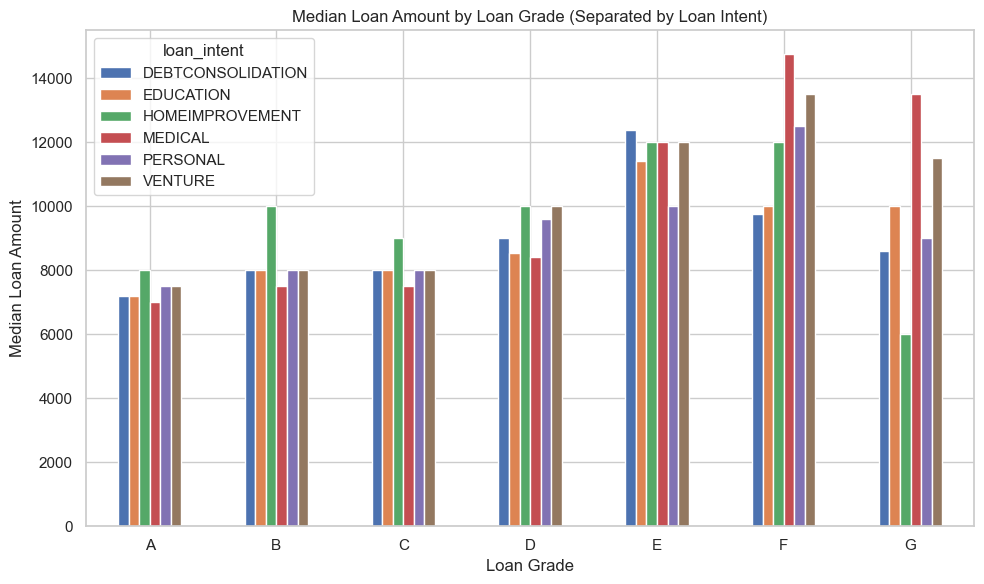

In [93]:
median_income_by_grade = df.groupby(['loan_grade', 'loan_intent'])['loan_amnt'].median().reset_index()

# Pivot the data so that we can have 'loan_grade' as index and 'loan_intent' as columns
pivot_data = median_income_by_grade.pivot(index='loan_grade', columns='loan_intent', values='loan_amnt')

# Create a bar chart
pivot_data.plot(kind='bar', figsize=(10, 6))

# Set labels and title
plt.xlabel('Loan Grade')
plt.ylabel('Median Loan Amount')
plt.title('Median Loan Amount by Loan Grade (Separated by Loan Intent)')
plt.xticks(rotation=0)  # Rotate x-axis labels for readability

# Display the chart
plt.tight_layout()
plt.show()



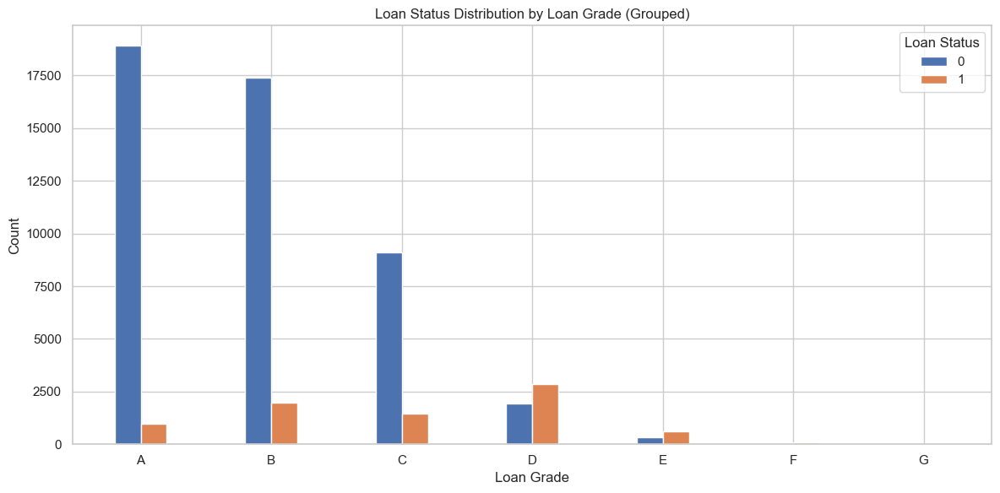

In [94]:
grouped_data = df.groupby(['loan_grade', 'loan_status'])['loan_status'].count().reset_index(name='count')

# Get unique loan grades and statuses
loan_grades = grouped_data['loan_grade'].unique()
loan_statuses = grouped_data['loan_status'].unique()

# Prepare data for plotting
data = {status: [] for status in loan_statuses}

for grade in loan_grades:
    grade_data = grouped_data[grouped_data['loan_grade'] == grade]
    for status in loan_statuses:
        count = grade_data.loc[grade_data['loan_status'] == status, 'count']
        data[status].append(count.iloc[0] if not count.empty else 0)

# Grouped Bar Chart
x = np.arange(len(loan_grades))  # Label locations
width = 0.2  # Width of bars

fig, ax = plt.subplots(figsize=(12, 6))

for i, status in enumerate(loan_statuses):
    ax.bar(x + i * width, data[status], width, label=status)

# Add labels and title
ax.set_title("Loan Status Distribution by Loan Grade (Grouped)")
ax.set_xlabel("Loan Grade")
ax.set_ylabel("Count")
ax.set_xticks(x + width * (len(loan_statuses) - 1) / 2)
ax.set_xticklabels(loan_grades)
ax.legend(title="Loan Status")
plt.tight_layout()
plt.show()

In [95]:
df.groupby(['cb_person_default_on_file','loan_status'])['loan_status'].count()

cb_person_default_on_file  loan_status
N                          0              41960
                           1               5463
Y                          0               5801
                           1               2497
Name: loan_status, dtype: int64

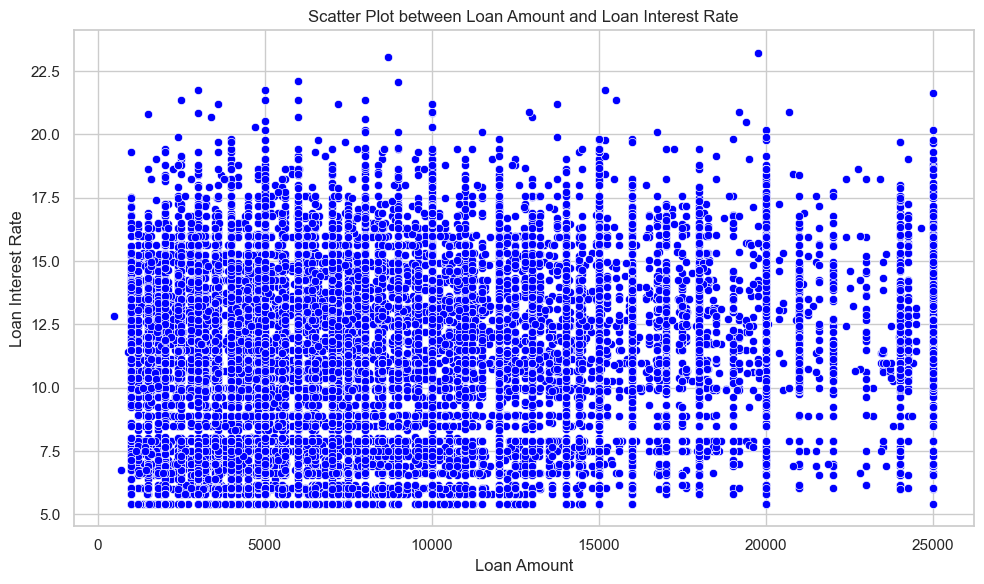

In [127]:
plt.figure(figsize=(10, 6))

# Scatter plot using seaborn
sns.scatterplot(x='loan_amnt', y='loan_int_rate', data=df, color='blue')

# Set labels and title
plt.xlabel('Loan Amount')
plt.ylabel('Loan Interest Rate')
plt.title('Scatter Plot between Loan Amount and Loan Interest Rate')

# Display the plot
plt.tight_layout()
plt.show()

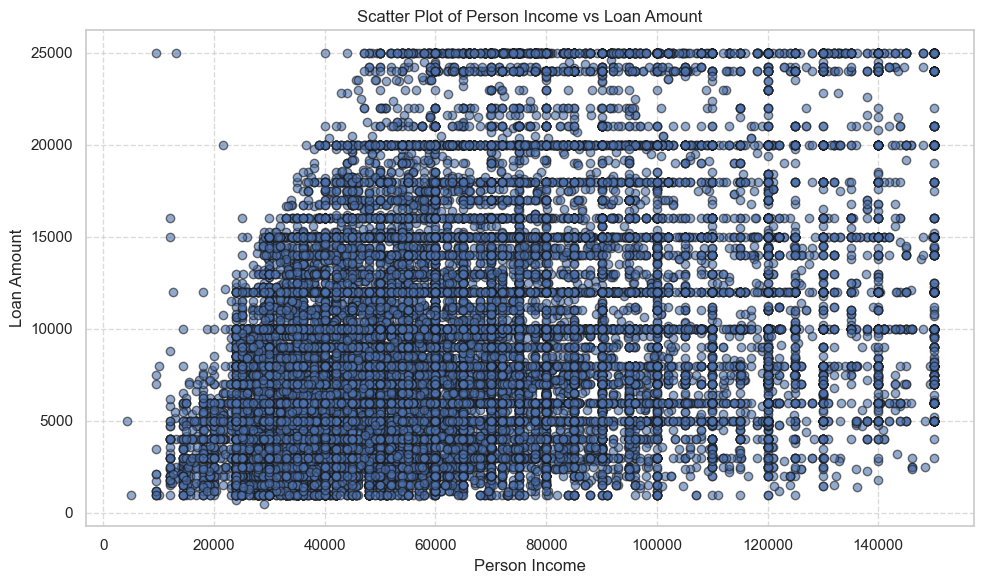

In [96]:
plt.figure(figsize=(10, 6))
plt.scatter(df['person_income'], df['loan_amnt'], alpha=0.6, edgecolor='k')

# Add labels and title
plt.title("Scatter Plot of Person Income vs Loan Amount")
plt.xlabel("Person Income")
plt.ylabel("Loan Amount")
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Show the plot
plt.show()

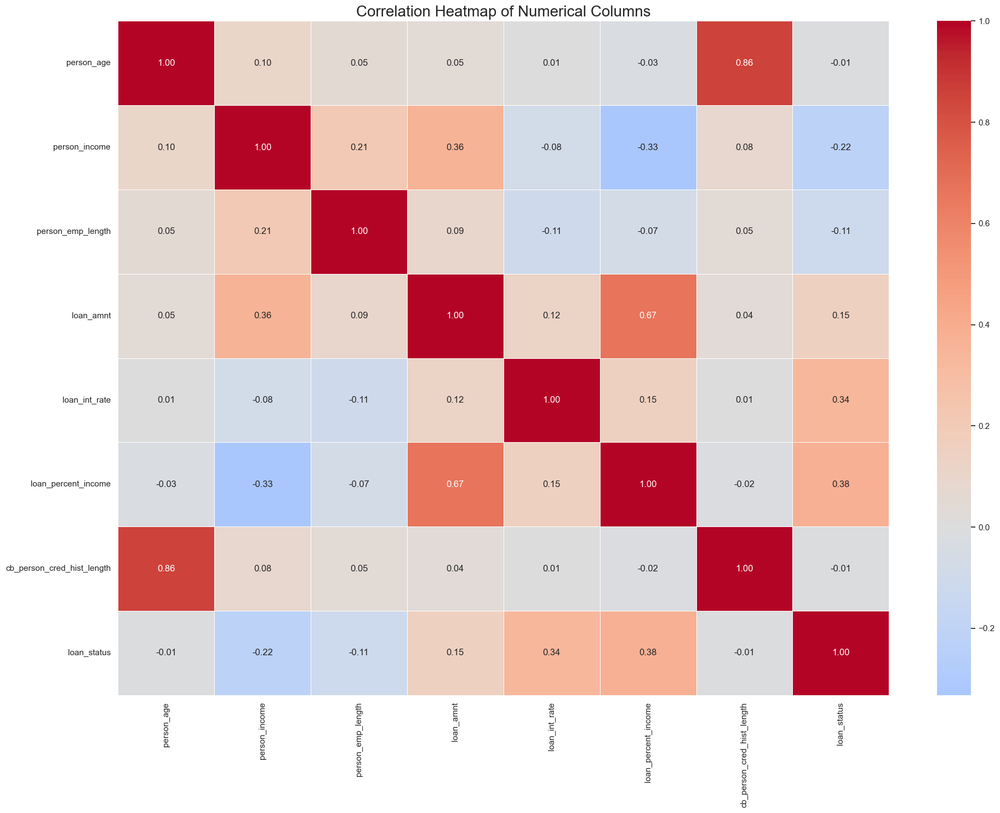

In [97]:
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Compute the correlation matrix for numerical columns
corr_matrix = df[numerical_cols].corr()

# Create the heatmap
plt.figure(figsize=(20, 15))  # Set figure size for better visibility
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", linewidths=0.5, fmt=".2f", center=0)

# Add title
plt.title("Correlation Heatmap of Numerical Columns", fontsize=20)
plt.tight_layout()

# Show the plot
plt.show()

# Encode Categorical Columns

In [98]:
from sklearn.preprocessing import LabelEncoder
columns_to_encode = [
    'loan_grade',
    'loan_intent',
    'person_home_ownership',
    'cb_person_default_on_file',
    'Age Level'
]

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Apply LabelEncoder to each column in the list
for column in columns_to_encode:
    # Check if the column is not already numeric (optional check)
    if df[column].dtype == 'object' or df[column].dtype == 'category':  # Apply encoding only to non-numeric columns
        df[column] = label_encoder.fit_transform(df[column])
    else:
        print(f"Skipping encoding for {column} as it's already numeric or not categorical.")
df

C:\Users\DANTECH\AppData\Local\Temp\ipykernel_16304\1015459407.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\DANTECH\AppData\Local\Temp\ipykernel_16304\1015459407.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\DANTECH\AppData\Local\Temp\ipykernel_16304\1015459407.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length,loan_status,Age Level
0,37,35000,3,0.00,1,1,6000,11.49,0.17,0,14,0,2
1,22,56000,2,6.00,3,2,4000,13.35,0.07,0,2,0,0
2,29,28800,2,8.00,4,0,6000,8.90,0.21,0,10,0,1
3,30,70000,3,14.00,5,1,12000,11.11,0.17,0,5,0,1
4,22,60000,3,2.00,3,0,6000,6.92,0.10,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
58640,34,120000,0,5.00,1,3,25000,15.95,0.21,1,10,0,1
58641,28,28800,3,0.00,3,2,10000,12.73,0.35,0,8,1,1
58642,23,44000,3,7.00,1,3,6800,16.00,0.15,0,2,1,0
58643,22,30000,3,2.00,1,0,5000,8.90,0.17,0,3,0,0


# Machine Learning

In [99]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

X = df.drop('loan_status', axis=1).values
y = df['loan_status'].values 

from sklearn.datasets import make_classification
X, y = make_classification(n_samples=3000, random_state=42)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 101)
# sc = StandardScaler()
# X_train = sc.fit_transform(X_train)
# X_test = sc.transform(X_test)
X

array([[-0.14378676,  0.01904516,  1.25465604, ..., -1.43863702,
        -1.26468604,  0.71817983],
       [-0.12664455, -1.26918901,  0.76909857, ...,  0.01616774,
         0.52838349,  1.33147368],
       [ 1.54862427, -0.65296822, -0.15376979, ..., -0.50516383,
        -0.59075838,  0.93989182],
       ...,
       [ 0.42776894, -1.54462117, -0.31818072, ...,  0.26617787,
        -1.40066985, -0.42572945],
       [-0.88115306, -0.05960985,  0.25094319, ...,  0.91662769,
        -1.59745422,  0.6578507 ],
       [ 0.98243883, -0.43335544,  0.13438744, ...,  0.93526876,
        -0.58880157,  0.82705174]])

## Logistic Regrission

In [56]:
from sklearn.linear_model import LogisticRegression
# Fit (train) the Logistic Regression classifier
log = LogisticRegression()
log.fit(X_train, y_train)
y_pred = log.predict(X_test)
print("Accuracy {0:.2f}%".format(100*accuracy_score(y_pred, y_test)))
cm = confusion_matrix(y_test, y_pred)
print(cm)

Accuracy 97.50%
[[288  12]
 [  3 297]]


## Random Forest

In [57]:
from sklearn.ensemble import RandomForestClassifier

# Fit (train) the Random Forest classifier
randforest = RandomForestClassifier()
randforest.fit(X_train, y_train)
y_pred = randforest.predict(X_test)
print("Accuracy {0:.2f}%".format(100*accuracy_score(y_pred, y_test)))
cm = confusion_matrix(y_test, y_pred)
print(cm)

# import pickle
# pickle.dump(randforest, open('ML_Model.pkl','wb'))

Accuracy 98.50%
[[293   7]
 [  2 298]]


In [64]:
with open('ML_Model.pkl', 'wb') as f:
    pickle.dump(randforest, f)

## KNN

In [58]:
from sklearn.neighbors import KNeighborsClassifier

# Fit (train) the KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_predict = knn.predict(X_test)
print("Accuracy {0:.2f}%".format(100*accuracy_score(y_pred, y_test)))
cm = confusion_matrix(y_test, y_pred)
print(cm)

Accuracy 98.50%
[[293   7]
 [  2 298]]


## SVC

In [61]:
from sklearn.svm import SVC

# Fit (train) the Support Vector Machine classifier
svm = SVC()
svm.fit(X_train, y_train)
y_predict = svm.predict(X_test)
print("Accuracy {0:.2f}%".format(100*accuracy_score(y_pred, y_test)))
cm = confusion_matrix(y_test, y_pred)
print(cm)

Accuracy 98.50%
[[293   7]
 [  2 298]]


In [60]:
report = classification_report(y_test, y_pred, output_dict=True)

# Convert the classification report to a DataFrame
report_df = pd.DataFrame(report).transpose()
report_df

,precision,recall,f1-score,support
0,0.99,0.98,0.98,300.00
1,0.98,0.99,0.99,300.00
accuracy,0.98,0.98,0.98,0.98
macro avg,0.99,0.98,0.98,600.00
weighted avg,0.99,0.98,0.98,600.00


In [65]:
X

array([[-0.14378676,  0.01904516,  1.25465604, ..., -1.43863702,
        -1.26468604,  0.71817983],
       [-0.12664455, -1.26918901,  0.76909857, ...,  0.01616774,
         0.52838349,  1.33147368],
       [ 1.54862427, -0.65296822, -0.15376979, ..., -0.50516383,
        -0.59075838,  0.93989182],
       ...,
       [ 0.42776894, -1.54462117, -0.31818072, ...,  0.26617787,
        -1.40066985, -0.42572945],
       [-0.88115306, -0.05960985,  0.25094319, ...,  0.91662769,
        -1.59745422,  0.6578507 ],
       [ 0.98243883, -0.43335544,  0.13438744, ...,  0.93526876,
        -0.58880157,  0.82705174]])